Found 15 CSV files.


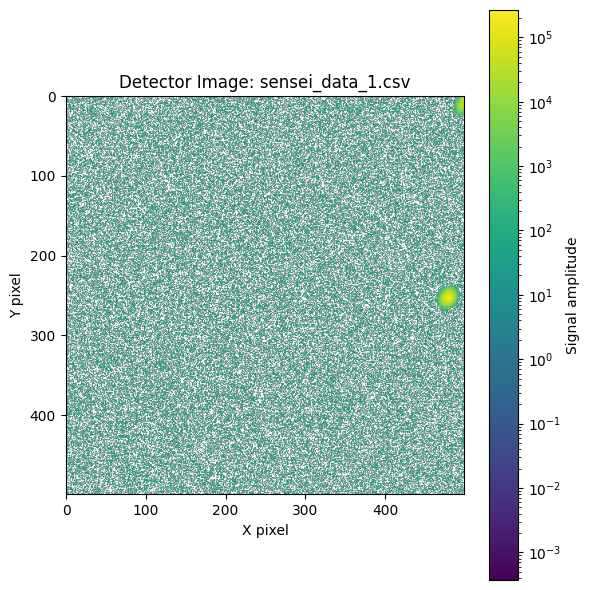

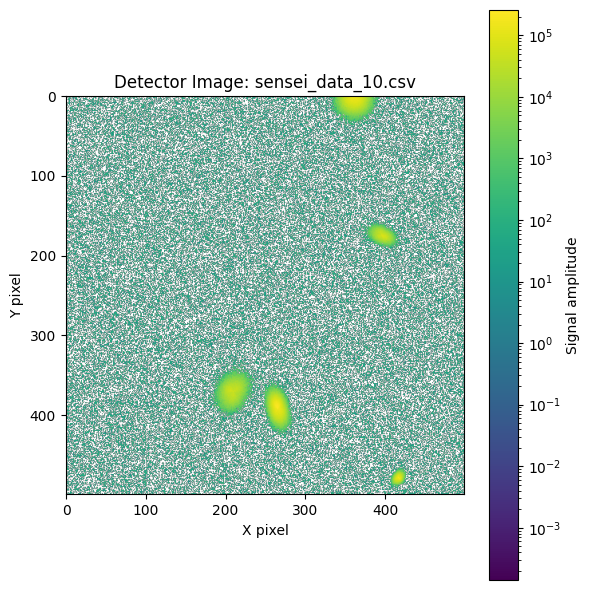

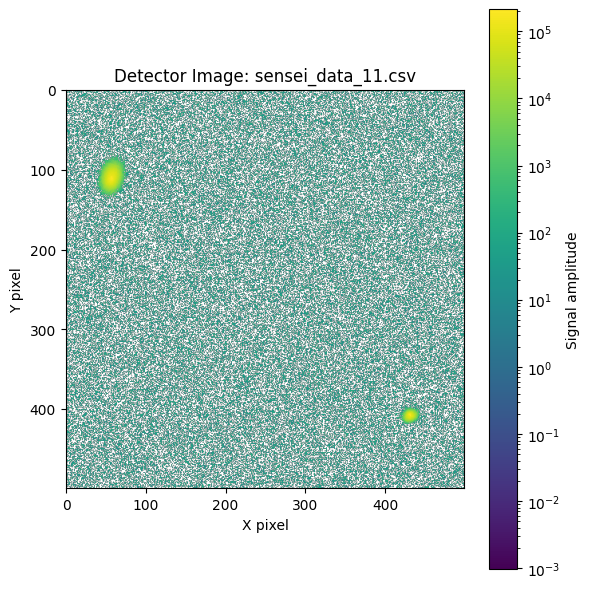

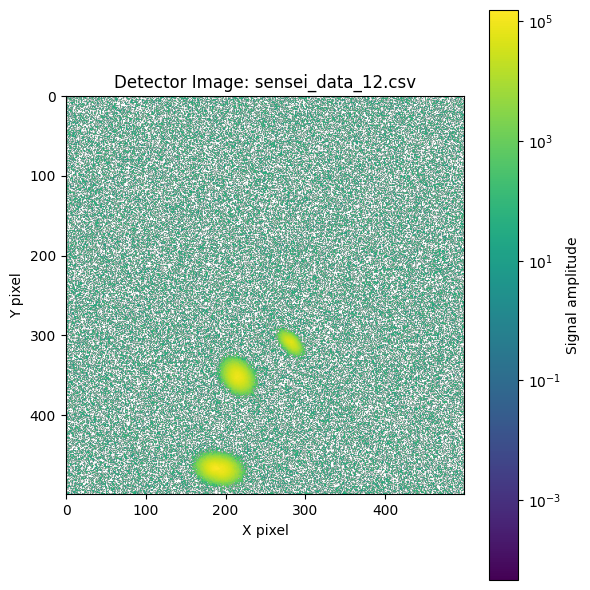

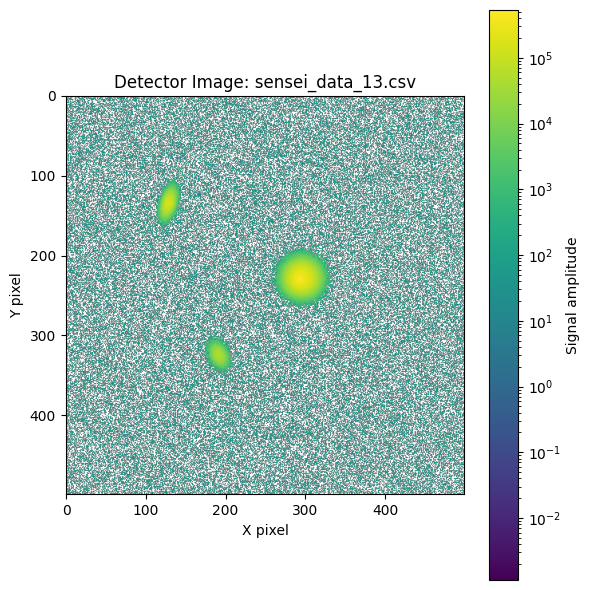

...

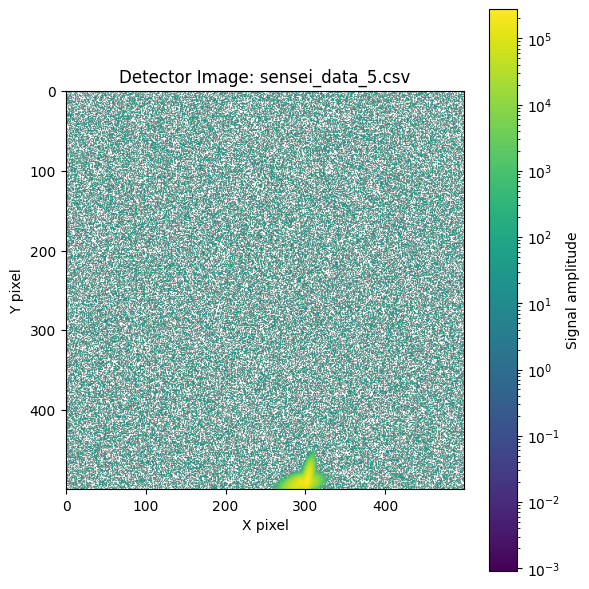

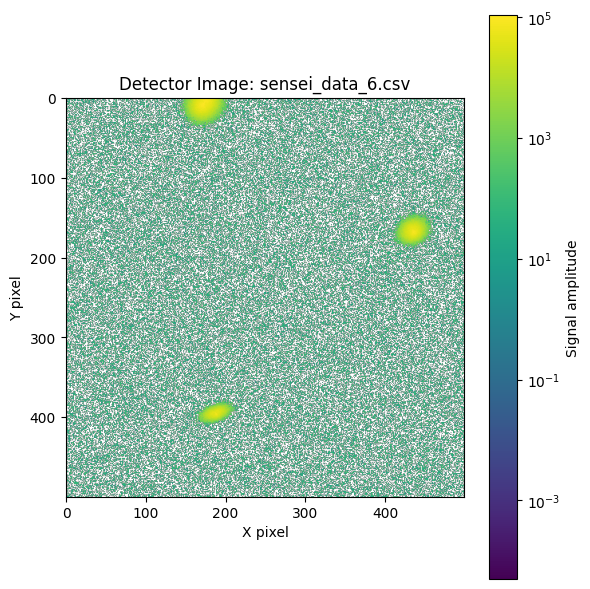

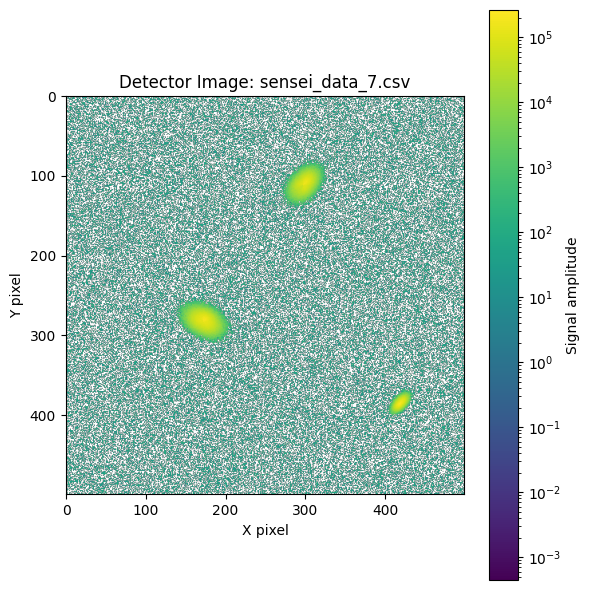

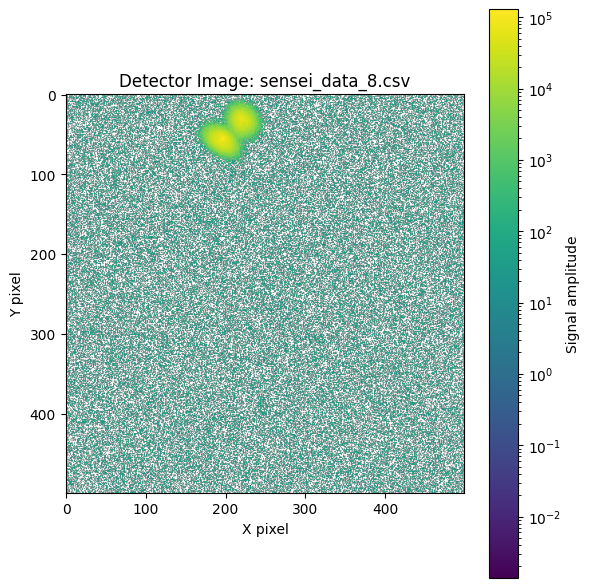

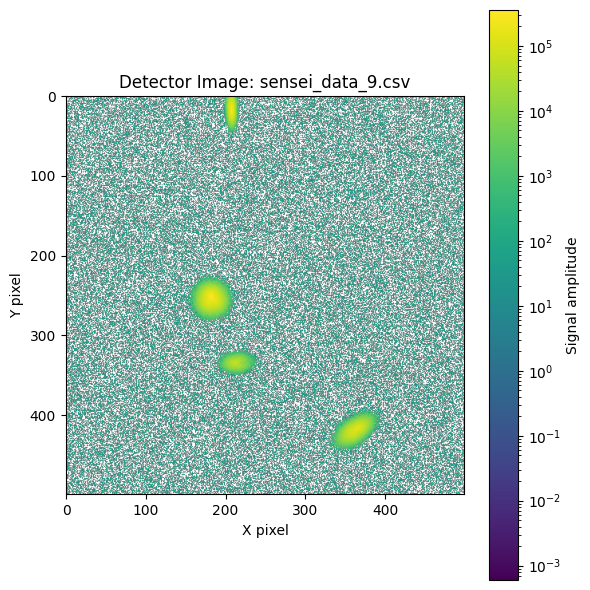

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Path to your CCD folder
folder = "CCD"

# List all CSV files
csv_files = [f for f in os.listdir(folder) if f.lower().endswith(".csv")]

print(f"Found {len(csv_files)} CSV files.")

data=np.zeros((len(csv_files),500,500))

MYINT=0
for fname in csv_files:
    path = os.path.join(folder, fname)
    
    # Load CSV as 2D array
    data[MYINT] = pd.read_csv(path, header=None).values
    
    # Plot
    plt.figure(figsize=(6,6))
    plt.imshow(data[MYINT], cmap="viridis",norm="log")    # or 'inferno', 'magma', etc.
    plt.colorbar(label="Signal amplitude")
    plt.title(f"Detector Image: {fname}")
    plt.xlabel("X pixel")
    plt.ylabel("Y pixel")
    plt.tight_layout()
    plt.show()
    MYINT += 1


In [289]:
x=np.arange(500)
y=np.arange(500)
XM, YM =np.meshgrid(x,y)
#Removes blobs from a correctly sized image and returns the corrected one
#Stops removing when there are no results above a given cutoff
def removeblobs(data,cutoff,radius):
    rad = 5#int(radius)
    retd = data.copy()
    while (True):
        s = np.argmax(retd)
        i = s%500
        j = int(s/500)
        if (i< rad):
            i = rad+1
        if (j< rad):
            j = rad+1
        if (i > 500-rad):
            i = 500-rad-1
        if (j > 500-rad):
            j = 500-rad-1
        if (retd[j,i]<=cutoff):
            print("breaking",retd[j,i])
            break
        gy, gx = np.gradient(np.log(np.abs(retd)+1))
        hxy, hxx = np.gradient(gx)
        hyy, hyx = np.gradient(gy)
        #print(np.std(hxx[j-rad:j+rad,i-rad:i+rad]))
        #plt.imshow(retd,norm="log")
        #plt.plot(i,j,"r.")
        #plt.show()
        HXX = np.mean(hxx[j-rad:j+rad,i-rad:i+rad])
        HXY = np.mean(hxy[j-rad:j+rad,i-rad:i+rad])
        HYX = np.mean(hyx[j-rad:j+rad,i-rad:i+rad])
        HYY = np.mean(hyy[j-rad:j+rad,i-rad:i+rad])
        amp = np.mean(retd[j-rad:j+rad,i-rad:i+rad])
        #print(HXX,HXY,HYX,HYY)
        #remgauss = np.exp((HXX*(XM-i)*(XM-i) + HXY*(XM-i)*(YM-j) + HYX*(YM-j)*(XM-i) + HYY*(YM-j)*(YM-j))/2)*amp
        dmesh = np.sqrt(-(HXX*(XM-i)*(XM-i) + HXY*(XM-i)*(YM-j) + HYX*(YM-j)*(XM-i) + HYY*(YM-j)*(YM-j))/2)
        retd[dmesh<radius] = cutoff
    return retd
        
def removeblobs2(data,cutoff,radius):
    rad = int(radius/2)
    retd = data.copy()
    while (True):
        s = np.argmax(retd)
        i = s%500
        j = int(s/500)
        if (retd[j,i]<=cutoff):
            print("breaking",retd[j,i])
            break
        dmesh = np.sqrt((XM-i)**2+(YM-j)**2)
        retd[dmesh<radius] = cutoff
    return retd
    

Image 0
breaking 5000.0


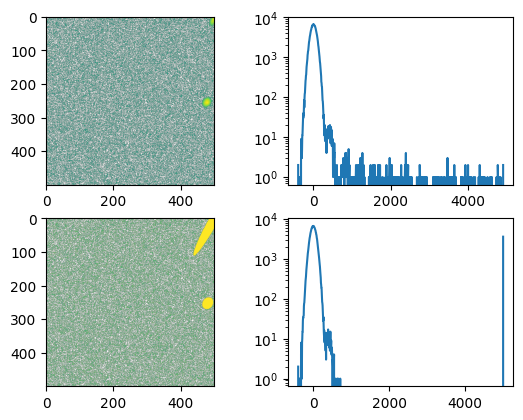

Image 1
breaking 5000.0


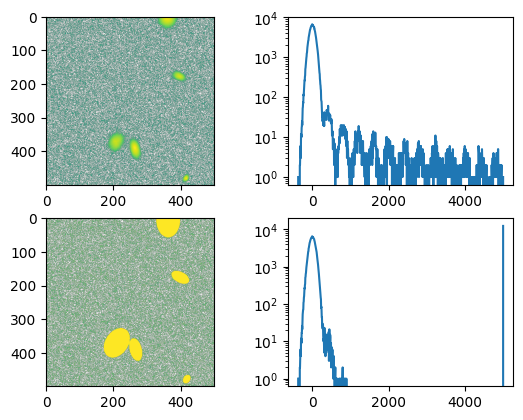

Image 2
breaking 5000.0


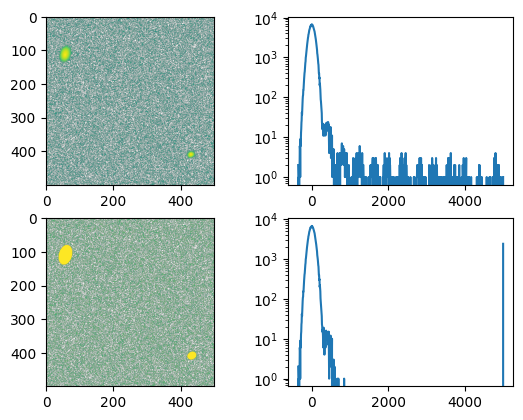

Image 3
breaking 5000.0


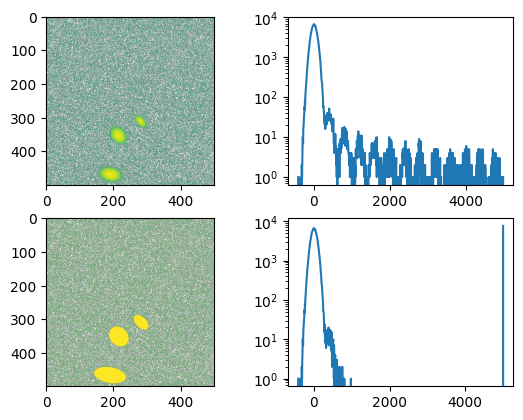

Image 4
breaking 5000.0


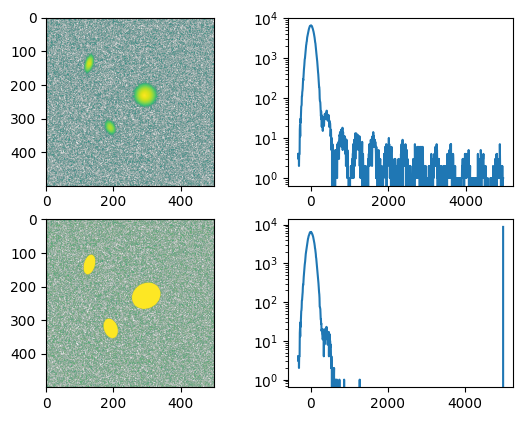

Image 5
breaking 5000.0


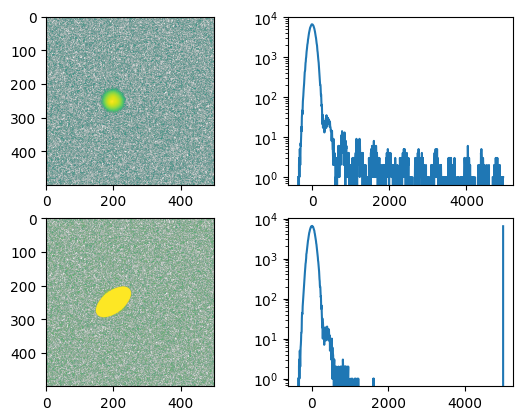

Image 6
breaking 5000.0


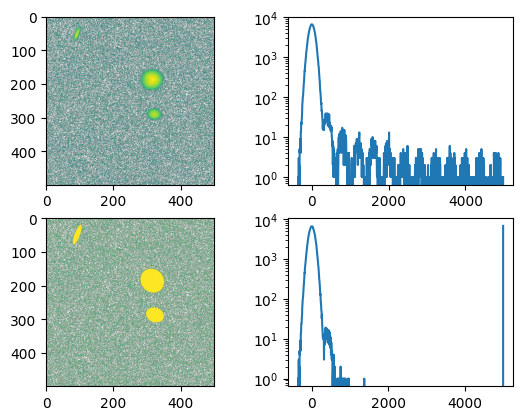

Image 7
breaking 5000.0


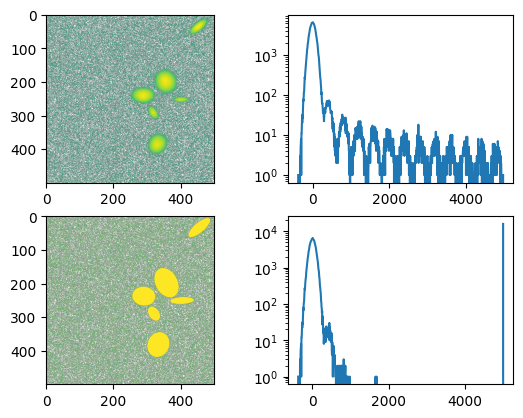

Image 8
breaking 5000.0


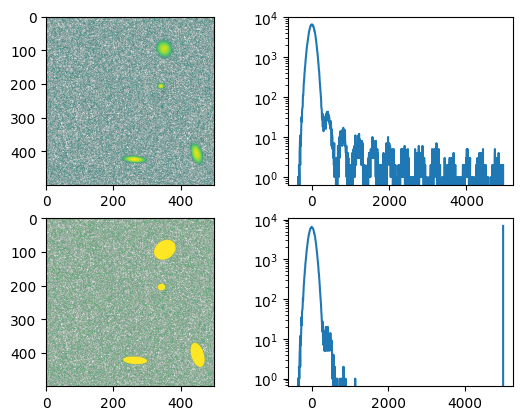

Image 9
breaking 5000.0


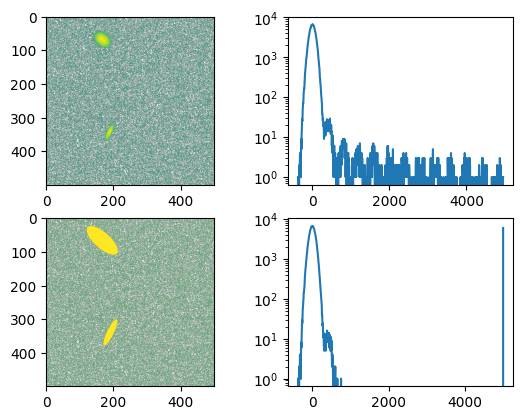

Image 10
breaking 5000.0


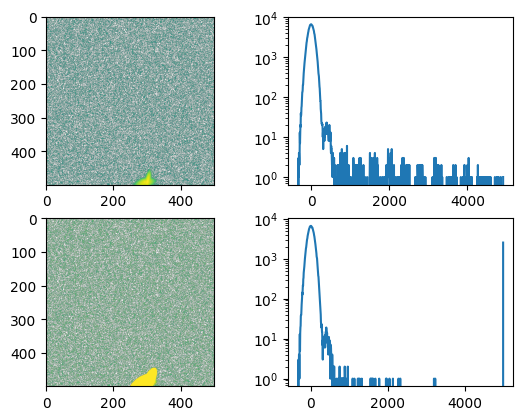

Image 11
breaking 5000.0


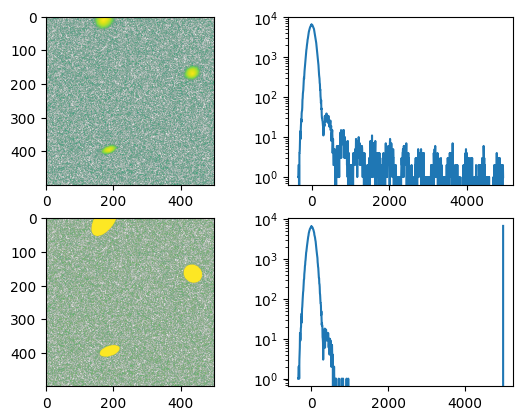

Image 12
breaking 5000.0


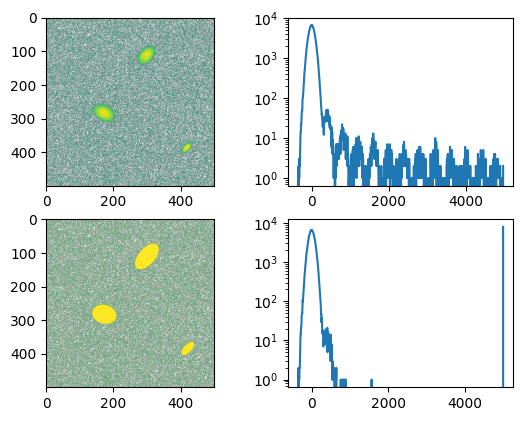

Image 13
breaking 5000.0


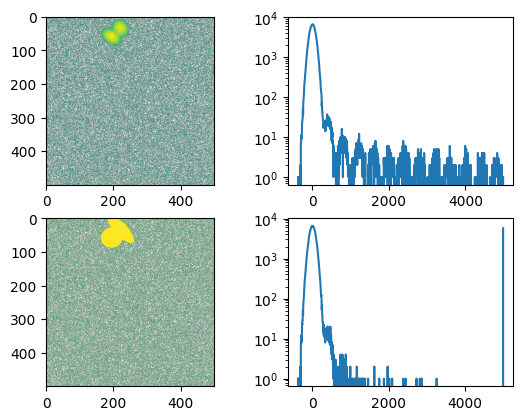

In [290]:
for i in range(0,14):
    print("Image",i)
    gneorp = data[i]
    plt.subplot(2,2,1)
    plt.imshow(gneorp,norm="log")
    plt.subplot(2,2,2)
    hist1y, hist1x =np.histogram(gneorp[gneorp<5000],1000)
    plt.plot(hist1x[1:],hist1y)
    plt.yscale("log")
    
    droog = removeblobs(gneorp,5000,3)
    plt.subplot(2,2,3)
    plt.imshow(droog,norm="log")
    hist2y, hist2x =np.histogram(droog,1000)
    plt.subplot(2,2,4)
    plt.plot(hist2x[1:],hist2y)
    plt.yscale("log")
    plt.show()

356 198


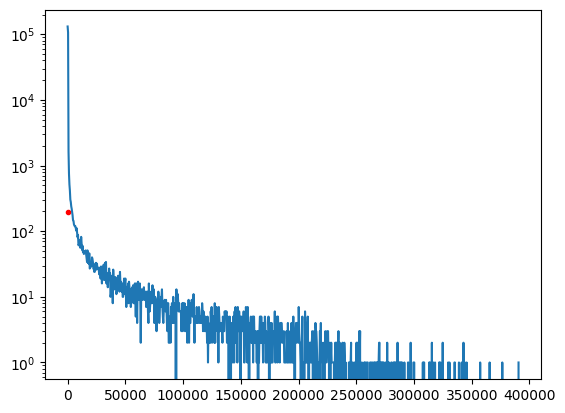

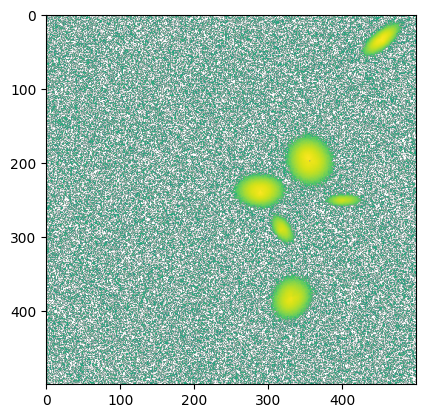

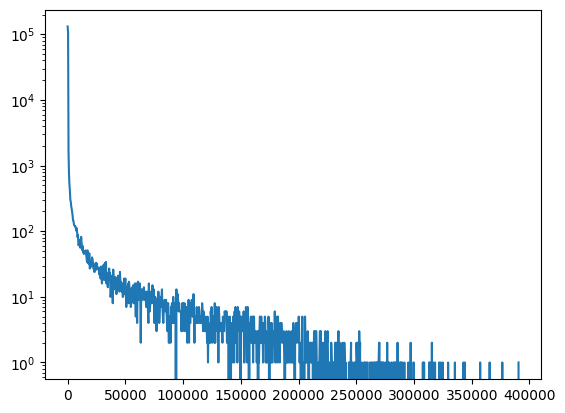

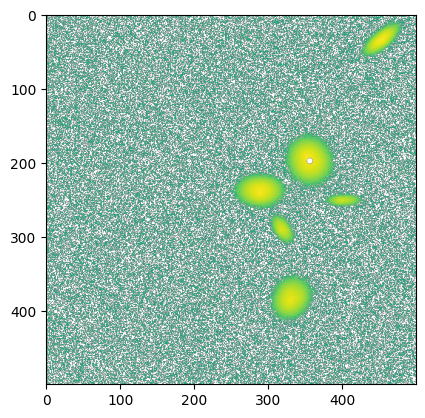

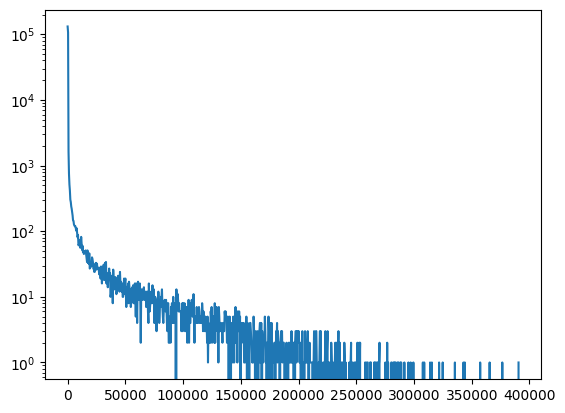

...

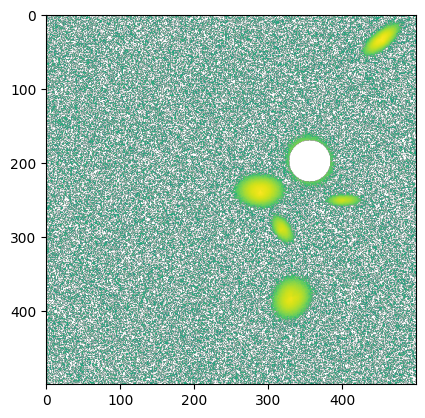

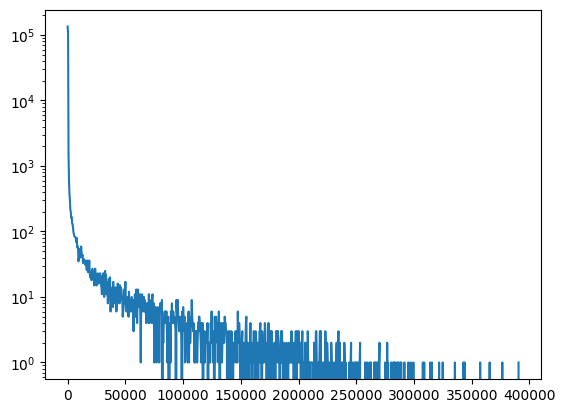

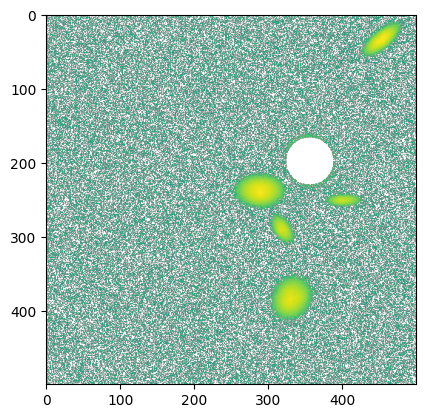

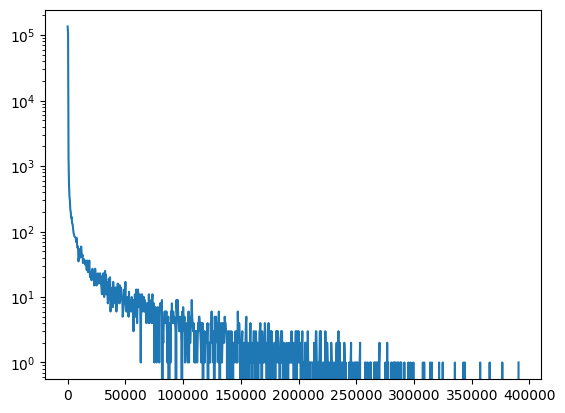

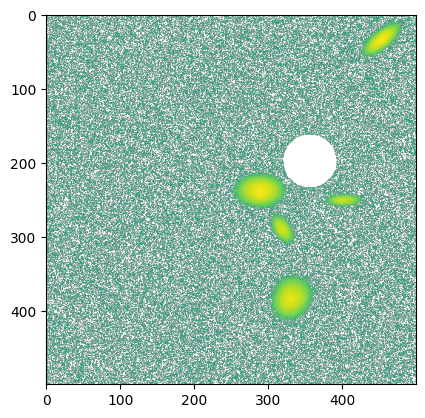

In [261]:
gneorp = data[7]
s = np.argmax(gneorp)
i = s%500
j = int(s/500)
print(i,j)
plt.plot(i,j,"r.")

x=np.arange(500)
y=np.arange(500)
XM, YM =np.meshgrid(x,y)
dmesh = np.sqrt((XM-i)**2+(YM-j)**2)
#Find the circle
for r in range(0,10):
    gneorp2 = gneorp * (dmesh>r*4)
    histy, histx = np.histogram(gneorp2,1000)
    plt.plot(histx[1:],histy)
    plt.yscale("log")
    plt.show()
    plt.imshow(gneorp2,norm="log")
    plt.show()



In [ ]:
gnhist = np.histogram(gneorp[gneorp>3000].ravel(),500)
plt.plot(gnhist[1][1:],gnhist[0][0:])
plt.yscale("log")
plt.show()

In [109]:
#PROCEDURE FOR IDENTIFYING AND REMOVING A BLOB
#1. Find the highest point
#2. Expand a circle until a zero is hit, use that as axis 1.
#3. Walk in opposite direction until a zero is hit, use that as radius 1.
#4. In the orthogonal direction, walk until a zero is hit in either direction. Once it is, lock that in as axis 2.
#5. Walk in the opposite direction until a zero is hit. Use that as radius 2.

356 198


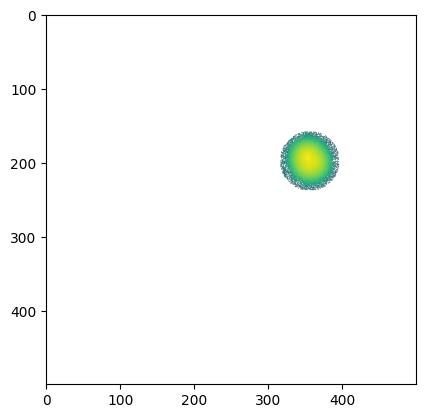

In [154]:
print(i,j)
x=np.arange(500)
y=np.arange(500)
XM, YM =np.meshgrid(x,y)
dmesh = np.sqrt((XM-i)**2+(YM-j)**2)
plt.imshow(gneorp*(dmesh<40),norm="log")
plt.show()
plt.imshow(gneorp*(dmesh<40),norm="log")
plt.show()

In [51]:
ALLDATA=data.ravel()


In [42]:
hist = np.histogram(ALLDATA[ALLDATA<5000],1000)

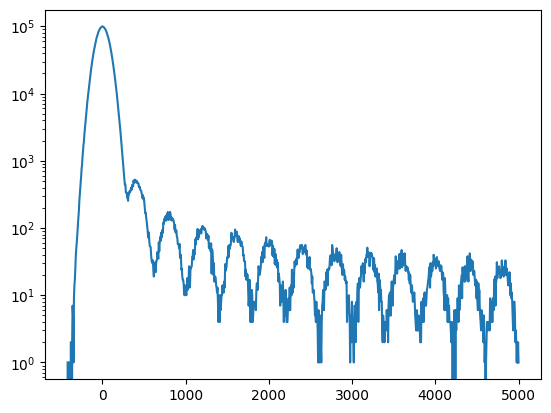

In [46]:
plt.plot(hist[1][1:],hist[0][0:])
plt.yscale("log")
plt.show()

In [11]:
len(data[0,:])

500

In [16]:
np.zeros((10,10))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])